In [1]:
import nest
import os
import network
import addons
import helpers
import matplotlib.pyplot as plt
import numpy as np
from network_params import net_dict
import network_params
from sim_params import sim_dict
from stimulus_params import stim_dict


              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.9.0
 Built: Sep 26 2025 04:43:14

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.



/home/hyc_1/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning:Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.


In [ ]:
dirs = os.listdir("data_background_rate_fig_1")
dirs = sorted(dirs)
#rates = np.linspace(5,20,len(dirs))
rates = np.zeros(len(dirs))

for i in range(len(dirs)):
    name = "data_background_rate_fig_1/" + dirs[i] + "/trial_0/"
    for j in range(8):
        rates[i] = float(dirs[i].split('_')[-1])
        helpers.plot_raster(name,"spike_recorder",500,900,1,binned=True,M= [20,20,20,20,20,20,20,20],std= [5,5,5,5,5,5,5,5],trial=0,plot=True,layer=j,rate=round(rates[i],2))

In [ ]:
dirs = os.listdir("data_background_rate_fig_1")
dirs = sorted(dirs)
#rates = np.linspace(5,20,len(dirs))
rates = np.zeros(len(dirs))

num_neurons =  np.array([20683, 5834, 21915, 5479, 4850, 1065, 14395, 2948])

data_pop = {}


for i in range(len(dirs)):
    name = "data_background_rate_fig_1/" + dirs[i] + "/trial_0/"
    rates[i] = float(dirs[i].split('_')[-1])
    voltage_data=  addons.load_data(name,"voltmeter")
    data_pop[i] = {}
    for j in range(len(num_neurons)):
        data_pop[i][j] = addons.split_data(voltage_data[j], num_neurons[j])

    del(voltage_data)

In [2]:
import random
import helpers
def prepare_data(data_pop):
    sd_names, node_ids, data = helpers.__load_spike_times(name,"spike_recorder",addons.analysis_dict["analysis_start"], addons.analysis_dict["analysis_end"])
#TODO: FIX THIS
    times = {}
    data_voltages = np.zeros((8,5000))
    bins = {}

    names = ["L23E", "L23I", "L4E", "L4I", "L5E", "L5I", "L6E", "L6I"]



    for i in range(len(data_pop)):
        random.shuffle(data_pop[i])

        data_voltages[i] =  np.mean(data_pop[i][0:1000],axis=0)
        neurons = np.unique(data[i]["sender"]) 
        random.shuffle(neurons)
        chosen_ones = neurons[1:1000]
        indices = []
        for indx in chosen_ones:
            indices = np.append(indices,np.where(data[i]["sender"]==indx))
        indices = np.array(indices,dtype=int)
        times_help = data[i][indices]["time_ms"] 

    #return data_voltages, times, times_help
    return data_voltages

In [ ]:
labels_freq = ["I = 6 spikes/s, Excitatory", "I = 9 spikes/s, Excitatory", "I = 12 spikes/s, Excitatory", "I = 18 spikes/s, Excitatory"]
labels = ["L23E", "L23I", "L4E", "L4I", "L5E", "L5I", "L6E", "L6I"]
colors = ["blue", "orange", "green", "red", "purple", "brown", "pink", "gray"]


for i in range(len(data_pop)):
    volt_currents = prepare_data(data_pop[i])
    plt.figure(figsize=(10,6))
    for j in range(8):
        if j%2 == 0:
            plt.plot(volt_currents[j], label=labels[j], color = colors[j])
    plt.legend(ncols = 2)
    plt.xlabel("time [ms]")
    plt.ylabel("mean voltage [mV]")
    plt.xlim(500,900)
    #plt.ylim(-250,-50)
    plt.title(labels_freq[i])
    plt.show()

In [ ]:
labels_freq = ["I = 6 spikes/s, Inhibitory", "I = 9 spikes/s, Inhibitory", "I = 12 spikes/s, Inhibitory", "I = 18 spikes/s, Inhibitory"]
labels = ["L23E", "L23I", "L4E", "L4I", "L5E", "L5I", "L6E", "L6I"]
colors = ["blue", "orange", "green", "red", "purple", "brown", "pink", "gray"]

for i in range(len(data_pop)):
    volt_currents = prepare_data(data_pop[i])
    plt.figure(figsize=(10,6))
    for j in range(8):
        if j%2 == 1:
            plt.plot(volt_currents[j], label=labels[j], color = colors[j])
    plt.legend(ncols = 2)
    plt.xlabel("time [ms]")
    plt.ylabel("mean voltage [mV]")
    plt.xlim(500,900)
    #plt.ylim(-250,-50)
    plt.title(labels_freq[i])
    plt.show()

In [2]:
from scipy.sparse import dok_matrix 
from scipy.fft import fft
from scipy.fft import fftfreq
from scipy import signal
from scipy.signal import butter, lfilter
from scipy.optimize import curve_fit
from scipy.signal import find_peaks
from scipy.interpolate import interp1d
from scipy.interpolate import pchip
from scipy.interpolate import make_smoothing_spline

def compute_FFT(signal_data,name_,rate,freq_sample= 0.001, lim_x = 200, low_log = 10, high_log =90,signal_xmin=500,signal_xmax=900,min_x=1,savefig=False,name_2=None,optional_plot=None):

    plt.rcParams.update({'font.size': 22})
    analysis_interval_start = (addons.analysis_dict["analysis_start"] -500) /0.2
    analysis_interval_end = (addons.analysis_dict["analysis_end"] -500)/ 0.2
    analysis_interval_start = int(analysis_interval_start)
    analysis_interval_end = int(analysis_interval_end)
    times_currents = np.linspace(addons.analysis_dict["analysis_start"],addons.analysis_dict["analysis_end"],num=int((addons.analysis_dict["analysis_end"]-addons.analysis_dict["analysis_start"])/0.2))

    FFT_Results = {}

    for i in range(len(signal_data)):
        FFT_Results[i] = fft(signal_data[i][analysis_interval_start:analysis_interval_end]-np.mean(signal_data[i][analysis_interval_start:analysis_interval_end]))

    #Calcular los valores de frequencia correspondientes
    freq = fftfreq(len(signal_data[i][analysis_interval_start:analysis_interval_end]),d=freq_sample)

    

    plt.figure(figsize=(25, 15),dpi=400)
    colors = [ '#fdae61', "#166d24", '#66c2a5', '#3288bd']
    pops = ["L23E","L4E","L5E","L6E"]
    # Graficar la amplitud en función de la frecuencia
    colors_filter = ['#d53e4f', '#3288bd']
    indx = int(len(signal_data[i][analysis_interval_start:analysis_interval_end])/2)
    freq_help = freq[:indx]
    x_freq = np.arange(freq_help[0], freq_help[-1], freq_help[1]-freq_help[0])
    j = 0
    for i in FFT_Results:
        restuls_help = np.abs(FFT_Results[i])[:indx]
        spl = make_smoothing_spline(freq_help, restuls_help)
        plt.plot(x_freq, spl(x_freq), color = colors[j], label = pops[i])
        #plt.plot(freq[:indx], np.abs(FFT_Results[i])[:indx],c = colors[j], label = pops[i])
        j=j+1
    plt.xlabel('frequency [Hz]', fontsize=22)
    plt.ylabel('ampltidue [spikes]', fontsize=22)
    plt.title("Fast Fourier Transform, background rate = " + str(rate), loc="center", size=22)
    plt.grid(True)
    plt.xlim(min_x,lim_x)

    result_fourier = {}

    for i in FFT_Results:
        result_fourier[i] = np.abs(FFT_Results[i])[:indx]
    results_freq = freq[:indx]


    plt.savefig("Figure2/FFT"+str(name_)+".svg", dpi=500, bbox_inches='tight')
    plt.close()


    return result_fourier, results_freq, indx

In [3]:
from scipy.sparse import dok_matrix 
from scipy.fft import fft
from scipy.fft import fftfreq
from scipy import signal
from scipy.signal import butter, lfilter, welch
from scipy.optimize import curve_fit
from scipy.signal import find_peaks
from scipy.interpolate import interp1d
from scipy.interpolate import pchip
from scipy.interpolate import make_smoothing_spline

def compute_welch(signal_data, name_, rate, freq_sample=0.001, lim_x=200,
                   min_x=1, savefig=False, nperseg=None, noverlap=None, window='hann', detrend='constant'):
    """
    Same interface as compute_FFT, but estimates the power spectrum via
    Welch's method (scipy.signal.welch) instead of a single raw FFT.

    Additional parameters
    ----------------------
    nperseg  : int or None. Length of each segment (in samples). If None,
               defaults to the full analysis window length // 8, matching
               scipy's default segmenting behavior — but for oscillation
               detection you likely want this explicit (e.g. covering a
               few cycles of your slowest frequency of interest).
    noverlap : int or None. Samples of overlap between segments. If None,
               defaults to nperseg // 2 (50% overlap, scipy default).
    window   : str, window function applied to each segment before FFT.
    detrend  : str or False, passed to scipy.signal.welch — 'constant'
               removes the per-segment mean (similar in spirit to your
               np.mean subtraction in compute_FFT, but done per-segment
               rather than once over the whole window).
    """

    plt.rcParams.update({'font.size': 22})
    analysis_interval_start = (addons.analysis_dict["analysis_start"] - 500) / 0.2
    analysis_interval_end = (addons.analysis_dict["analysis_end"] - 500) / 0.2
    analysis_interval_start = int(analysis_interval_start)
    analysis_interval_end = int(analysis_interval_end)
    times_currents = np.linspace(
        addons.analysis_dict["analysis_start"],
        addons.analysis_dict["analysis_end"],
        num=int((addons.analysis_dict["analysis_end"] - addons.analysis_dict["analysis_start"]) / 0.2)
    )

    fs = 1.0 / freq_sample  # sampling frequency in Hz (freq_sample is the sampling *period*)

    Welch_Results = {}
    Welch_Freqs = {}

    for i in range(len(signal_data)):
        seg = signal_data[i][analysis_interval_start:analysis_interval_end]
        seg = seg - np.mean(seg)

        f, Pxx = welch(
            seg,
            fs=fs,
            window=window,
            nperseg=nperseg if nperseg is not None else len(seg) // 8,
            noverlap=noverlap,
            detrend=detrend,
            scaling='density'
        )
        Welch_Freqs[i] = f
        Welch_Results[i] = Pxx

    plt.figure(figsize=(25, 15), dpi=400)
    colors = ['#fdae61', "#166d24", '#66c2a5', '#3288bd']
    pops = ["L23E", "L4E", "L5E", "L6E"]
    colors_filter = ['#d53e4f', '#3288bd']

    j = 0
    for i in Welch_Results:
        freq_help = Welch_Freqs[i]
        results_help = Welch_Results[i]
        x_freq = np.arange(freq_help[0], freq_help[-1], freq_help[1] - freq_help[0])
        spl = make_smoothing_spline(freq_help, results_help)
        #plt.plot(x_freq, spl(x_freq), color=colors[j], label=pops[i])
        plt.plot(freq_help, results_help, c=colors[j], label=pops[i])
        j = j + 1

    plt.xlabel('frequency [Hz]', fontsize=22)
    plt.ylabel('power spectral density [spikes²/Hz]', fontsize=22)
    plt.title("Welch PSD, background rate = " + str(rate), loc="center", size=22)
    plt.grid(True)
    plt.yscale('log')
    plt.xlim(min_x, lim_x)

    result_welch = {i: Welch_Results[i] for i in Welch_Results}
    results_freq = {i: Welch_Freqs[i] for i in Welch_Freqs}

    if savefig:
        plt.savefig("Figure2/Welch" + str(name_) + ".svg", dpi=500, bbox_inches='tight')
    plt.close()

    return result_welch, results_freq

In [4]:
dirs = os.listdir("data_background_rate_fig_1")
dirs = sorted(dirs)
#rates = np.linspace(5,20,len(dirs))
rates = np.zeros(len(dirs))

labels_rate = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
names = [6,9,12,18]
pop_activity = np.zeros((len(dirs),4,25000))

freq_sample = 0.0002

for i in range(len(dirs)):
    name = "data_background_rate_fig_1/" + dirs[i] + "/trial_0/"
    for j in range(4):
        name_2 = name + "measurements/pop_activities/pop_activity_" + str(j*2) + ".dat"
        pop_activity[i][j] = np.loadtxt(name_2)
    a, b, c = compute_FFT(pop_activity[i],name_2=name,rate=labels_rate[i],freq_sample=freq_sample,name_= names[i])
    d, e = compute_welch(pop_activity[i],rate=labels_rate[i],freq_sample=freq_sample,name_= names[i],nperseg=1000,noverlap=500, savefig=True)

In [4]:
dirs = os.listdir("data_background_rate_fig_1")
dirs = sorted(dirs)
#rates = np.linspace(5,20,len(dirs))
rates = np.zeros(len(dirs))

labels_rate = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
names = [6,9,12,18]
pop_activity = np.zeros((len(dirs),4,25000))

freq_sample = 0.0002

for i in range(len(dirs)):
    name = "data_background_rate_fig_1/" + dirs[i] + "/trial_0/"
    for j in range(4):
        name_2 = name + "measurements/pop_activities2/pop_activity_" + str(j*2) + ".dat"
        pop_activity[i][j] = np.loadtxt(name_2)

In [ ]:
dirs = os.listdir("data_background_rate_fig_1")
dirs = sorted(dirs)
#rates = np.linspace(5,20,len(dirs))
rates = np.zeros(len(dirs))

labels_rate = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
neurons = {}
times = {}

for i in range(len(dirs)):
    name = "data_background_rate_fig_1/" + dirs[i] + "/trial_0/"
    neurons[i] = []
    times[i] = []
    sd_names, node_ids, data = helpers.__load_spike_times(name,"spike_recorder",addons.analysis_dict["analysis_start"], addons.analysis_dict["analysis_end"])
    last_node_id = node_ids[-1, -1]
    mod_node_ids = np.abs(node_ids - last_node_id) + 1
    for j, n in enumerate(sd_names):
        times[i].append(data[j]["time_ms"])
        neurons[i].append(np.abs(data[j]["sender"] - last_node_id) + 1)

In [6]:
bin_size = 15
peaks = {}
properties = {}
distances = {}
amplitudes = {}
bins = {}
bins_2 = {}
distances_mean = np.zeros((len(pop_activity),len(pop_activity[0])))
amplitudes_mean = np.zeros((len(pop_activity),len(pop_activity[0])))
distances_std = np.zeros((len(pop_activity),len(pop_activity[0])))
amplitudes_std = np.zeros((len(pop_activity),len(pop_activity[0])))
bins_mean = np.zeros((len(pop_activity),len(pop_activity[0]),bin_size+1))
bins_2_mean = np.zeros((len(pop_activity),len(pop_activity[0]),bin_size+1))
amplitudes_23E = {}
colors = [ '#fdae61', "#166d24", '#66c2a5', '#3288bd']
distances_23E = {}

amplitudes_4E = {}
distances_4E = {}

inputs = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
layers = ["L23E", "L4E", "L5E", "L6E"]

stp = 5

plot = True 
for i in range(len(pop_activity)):
    peaks[i] = {}
    properties[i] = {}
    distances[i] = {}
    amplitudes[i] = {}
    bins[i] = {}
    bins_2[i] = {}
    for j in range(len(pop_activity[i])):
        peaks[i][j] = {}
        properties[i][j] = {}
        distances[i][j] = {}
        amplitudes[i][j] = {}
        bins[i][j] = {}
        bins_2[i][j] = {}
        maximum = np.max(pop_activity[i][j])
        #peaks[i][j], properties[i][j] = find_peaks(pop_activity[i][j], height=0.002, distance=20,width=3) 
        peaks[i][j], properties[i][j] = find_peaks(pop_activity[i][j], height=0.001, distance=20,width=3) # THIS IS THE THRSHOLD  FOR FAST RHYTHMS
        #peaks[i][j], properties[i][j] = find_peaks(pop_activity[i][j], height=0.06, distance=20,width=3) # THIS IS THE THRESHOLD FOR L5E 

        amplitudes[i][j] = pop_activity[i][j][peaks[i][j]]
        if j == 0:
            amplitudes_23E[i] = amplitudes[i][j]
        if j == 2:
            amplitudes_4E[i] = amplitudes[i][j]
        
        if plot:
            fig = plt.figure(figsize=(10,6),dpi = 300)
            ax1 = fig.add_subplot(111)
            ax2 = fig.add_subplot(111,frameon=False)
            #fig, ax1,ax2 = plt.subplots(figsize=(10,6),dpi = 300)
            #ax2 = ax1.twinx()
            ax2.plot(times[i][j][::stp],neurons[i][j][::stp], ".", color=colors[j],alpha = 0.2)
            ax1.plot(pop_activity[i][j], label = "population activity", color=colors[j])
            ax1.plot(peaks[i][j], amplitudes[i][j], "x",label = "peaks", color="black")
            ax2.set_xlabel("time [ms]")
            ax1.set_ylabel("population activity [spikes]")
            ax2.set_yticklabels([])
            ax1.set_xticklabels([])
            ax1.grid()
            #ax1.legend()
            #ax1.set_ylim(0,maximum*1.1)
            ax1.set_xlim(1000,4800)
            ax2.set_xlim(700,1460)
            ax1.set_title("Peaks in population activity, " + inputs[i] + ", " + layers[j])
            #plt.show()
            plt.close()
            #amplitudes[i][j][m] = NormalizeData(amplitudes[i][j][m])
        amplitudes_mean[j][i] = np.mean(amplitudes[i][j])
        amplitudes_std[j][i] = np.std(amplitudes[i][j])
        amplitudes[i][j], bins[i][j] = np.histogram(amplitudes[i][j], bins=bin_size, density=False)
        burst_distances= []
        for k in range(len(properties[i][j]['left_ips'])-1):
            #burst_distance = (properties[i][j]['left_ips'][k+1]-properties[i][j]['right_ips'][k]) + properties[i][j]['widths'][k] 
            #burst_distance = (properties[i][j]['left_ips'][k+1]-properties[i][j]['right_ips'][k])
            burst_distance = ((properties[i][j]['left_ips'][k+1]-properties[i][j]['right_ips'][k]) + properties[i][j]['widths'][k])*0.2
            burst_distances.append(burst_distance)
        distances[i][j] = burst_distances
        distances_mean[j][i] = np.mean(distances[i][j])
        distances_std[j][i] = np.std(distances[i][j])
        if j == 0:
            distances_23E[i] = burst_distances
        if j == 2: 
            distances_4E[i] = burst_distances
        distances[i][j], bins_2[i][j] = np.histogram(distances[i][j], bins=bin_size, density=False)



In [4]:
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from scipy.optimize import curve_fit

In [5]:
def gaus(x,a,x0,sigma):
    return a*np.exp(-(x-x0)**2/(2*sigma**2))

In [6]:
def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

In [ ]:
div_factor =1
colors = [ '#fdae61', "#166d24", '#66c2a5', '#3288bd']
fs = 29
labels = ["23E", "4E", "5E", "6E"]
titles = ["I = 6 spikes/s", "I = 9 spikes/s", "I = 12 spikes/s", "I = 18 spikes/s"]
plot_gaus = np.linspace(0,50,2000)

means_distance = np.zeros((len(pop_activity),len(pop_activity[0])))
stds_distance = np.zeros((len(pop_activity),len(pop_activity[0])))

for i in range(len(pop_activity)):
    plt.figure(figsize=(25,15),dpi = 300)
    plt.grid()
    for j in range((len(distances))):
        n = np.arange(len(bins_2[i][j])-1)
        x_spline = pchip(n, bins_2[i][j][:-1])
        n_ = np.linspace(n.min(), n.max(), 2000)
        y_spline = pchip(n, distances[i][j])
        data = NormalizeData(y_spline(n_))
        data = y_spline(n_)
        try:
            popt, pcov = curve_fit(gaus, n_, data, p0=[1, np.mean(n_), np.std(n_)])
            means_distance[j][i] = popt[1]
            stds_distance[j][i] = np.abs(popt[2])
            #plt.plot(plot_gaus, gaus(plot_gaus, *popt), color= colors[int(j)], label = labels[j])
        except:
            
            pass
        #plt.plot(x_spline(n_)/div_factor, gaus(n_, *popt), color= colors[int(j)], label = labels[j])
        #plt.plot(plot_gaus, gaus(plot_gaus, *popt), color= colors[int(j)], label = labels[j])
        plt.plot(x_spline(n_)/div_factor, data,color= colors[int(j)],label=labels[j])
        #plt.bar(bins_2[i][j][1:],NormalizeData(distances[i][j]), color=colors[int(j)], alpha=0.2, label = labels[j])
    plt.xlabel("time [ms]", fontsize=fs)
    plt.ylabel("pdf", fontsize=fs)
    plt.ylim(0,200)
    plt.xlim(0,50)
    plt.title(titles[i], fontsize=fs)
    if i == 3:
        plt.legend(fontsize=fs,title="Populations",title_fontsize=50, ncols = 2, prop = {"size": 60})
    #plt.savefig("Figure2/Distances_noGauss"+str(i)+".svg", dpi=300, bbox_inches='tight')
    #plt.close()

In [ ]:
div_factor =1
colors = [ '#fdae61', "#166d24", '#66c2a5', '#3288bd']
fs = 29
labels = ["23E", "4E", "5E", "6E"]
titles = ["I = 6 spikes/s", "I = 9 spikes/s", "I = 12 spikes/s", "I = 18 spikes/s"]
x_plot = np.linspace(0.0005,0.2,2000)

means_amplitude = np.zeros((len(pop_activity),len(pop_activity[0])))
stds_amplitude = np.zeros((len(pop_activity),len(pop_activity[0])))

for i in range(len(pop_activity)):
    plt.figure(figsize=(25,15),dpi = 300)
    plt.grid()
    for j in range((len(amplitudes))):
        n = np.arange(len(bins[i][j])-1)
        x_spline = pchip(n, bins[i][j][:-1])
        n_ = np.linspace(n.min(), n.max(), 2000)
        y_spline = pchip(n, amplitudes[i][j])
        #data = NormalizeData(y_spline(n_))
        data = y_spline(n_)
        popt, pcov = curve_fit(gaus, x_spline(n_), data, p0=[100, np.mean(x_spline(n_)), np.std(x_spline(n_))])
        means_amplitude[j][i] = popt[1]
        stds_amplitude[j][i] = np.abs(popt[2])
        #plt.plot(x_plot, gaus(x_plot, *popt), color= colors[int(j)], label = labels[j])
        plt.plot(x_spline(n_), data,color= colors[int(j)],label=labels[j])
        #plt.bar(bins_2[i][j][1:],NormalizeData(amplitudes[i][j]), color=colors[int(j)], alpha=0.2, label = labels[j])
    plt.xlabel("amplitude [spikes]", fontsize=fs)
    #plt.ylabel("pdf", fontsize=fs)
    plt.ylim(0,210)
    plt.xlim(0.0005,0.2)
    plt.title(titles[i], fontsize=fs)
    if i == 2:
        plt.legend(fontsize=fs,title="Populations",title_fontsize=50, ncols = 2, prop = {"size": 60})


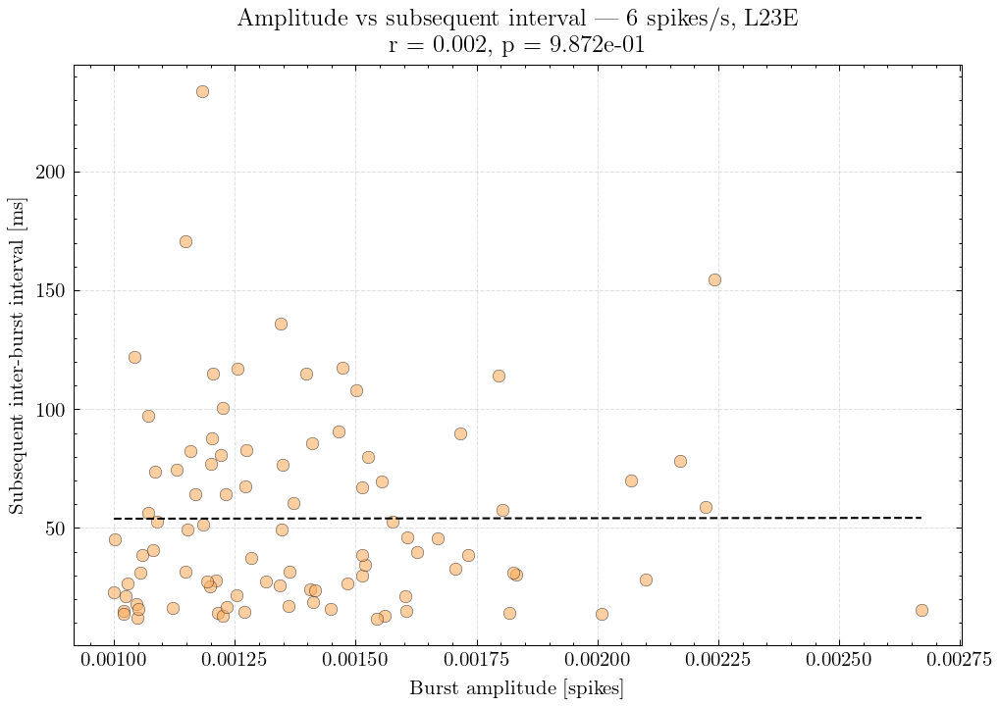

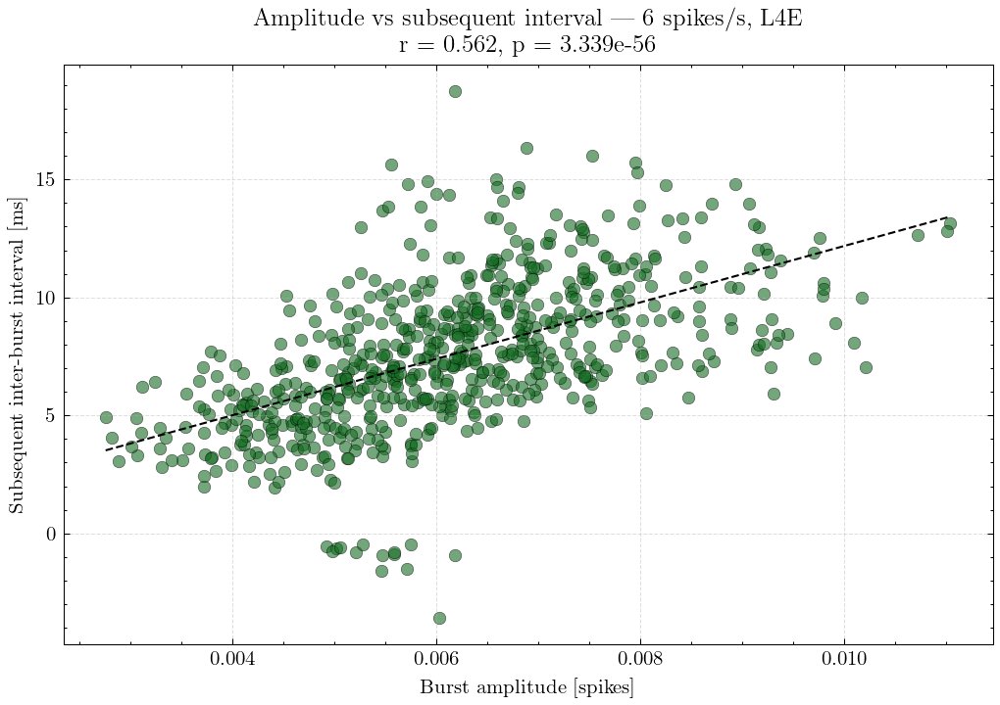

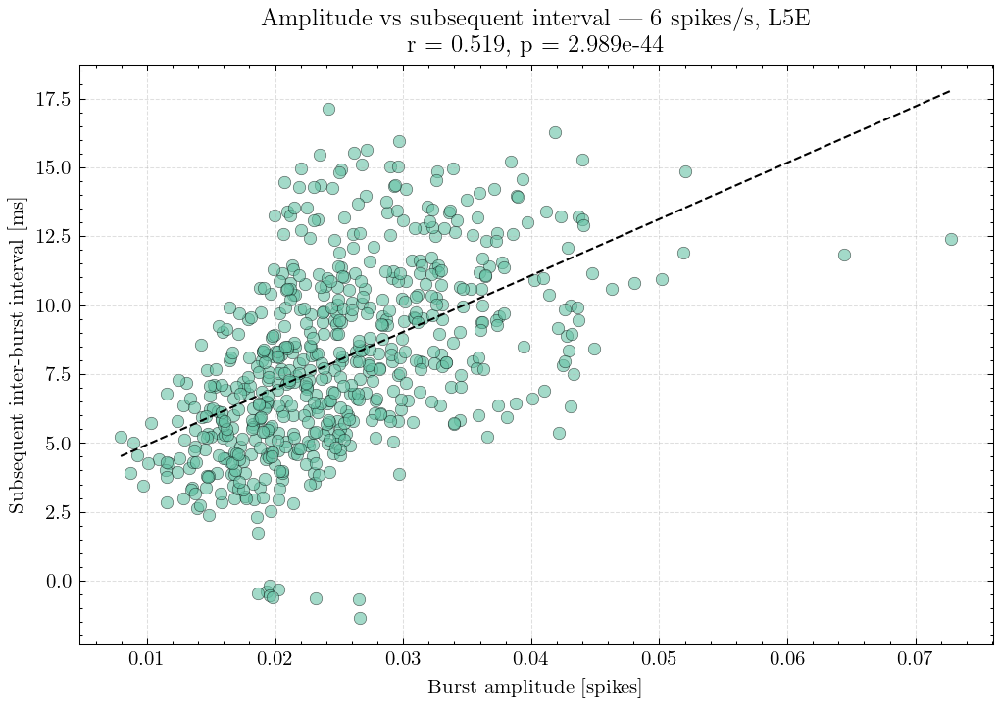

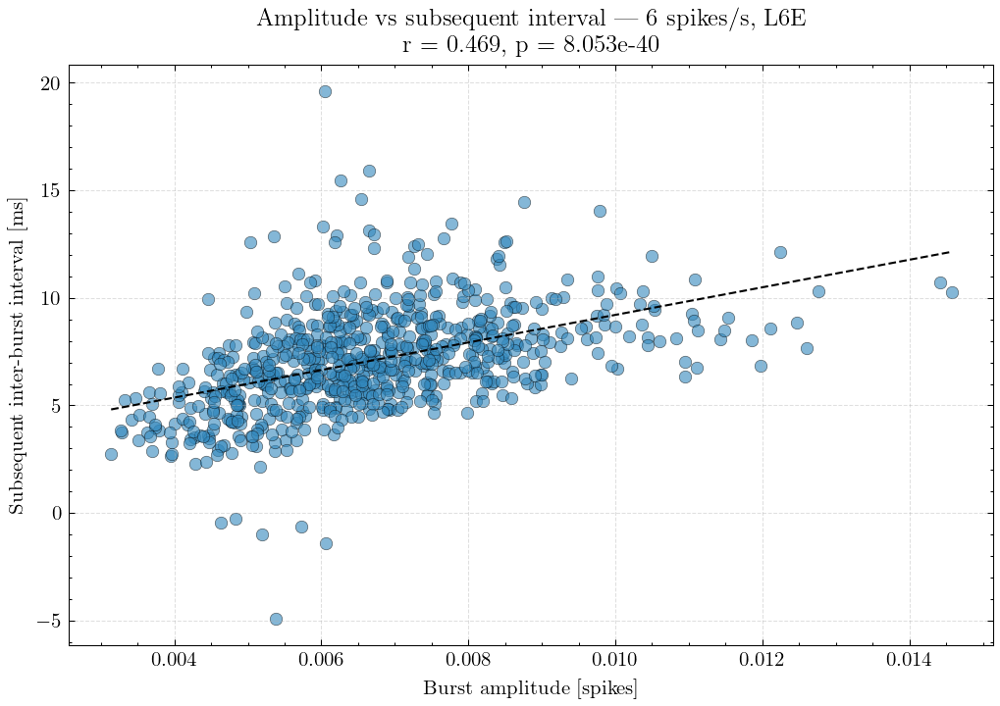

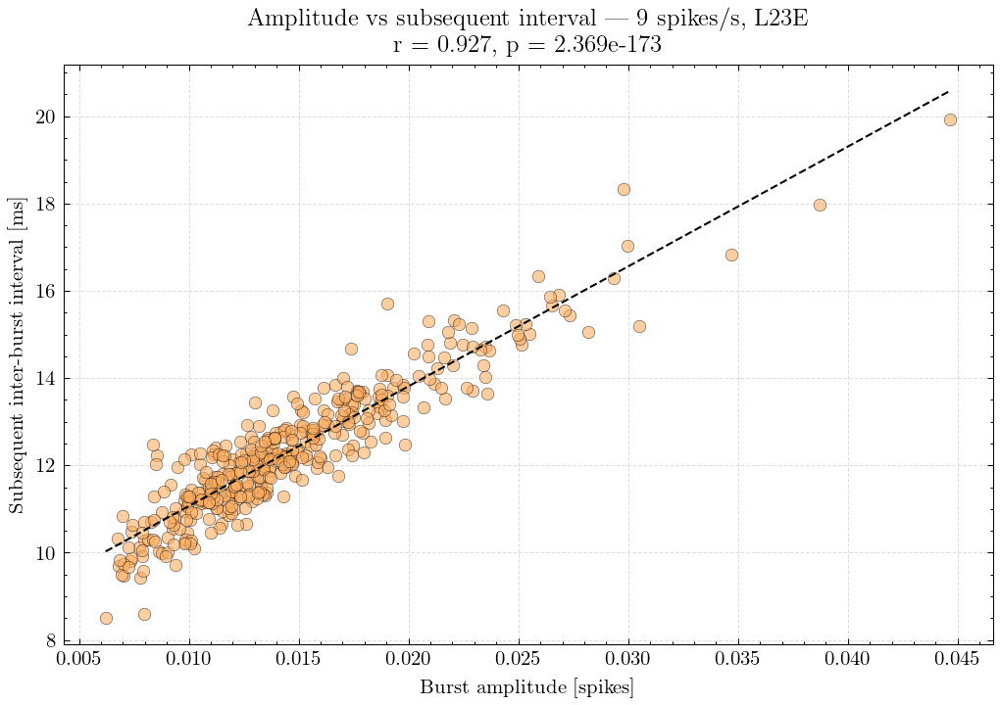

...

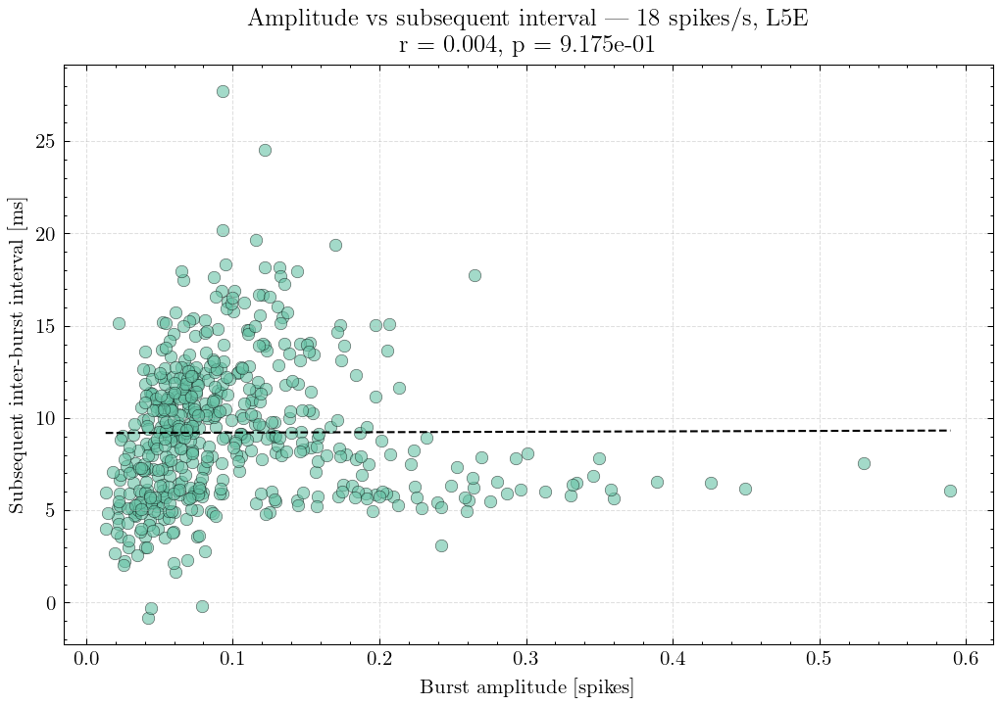

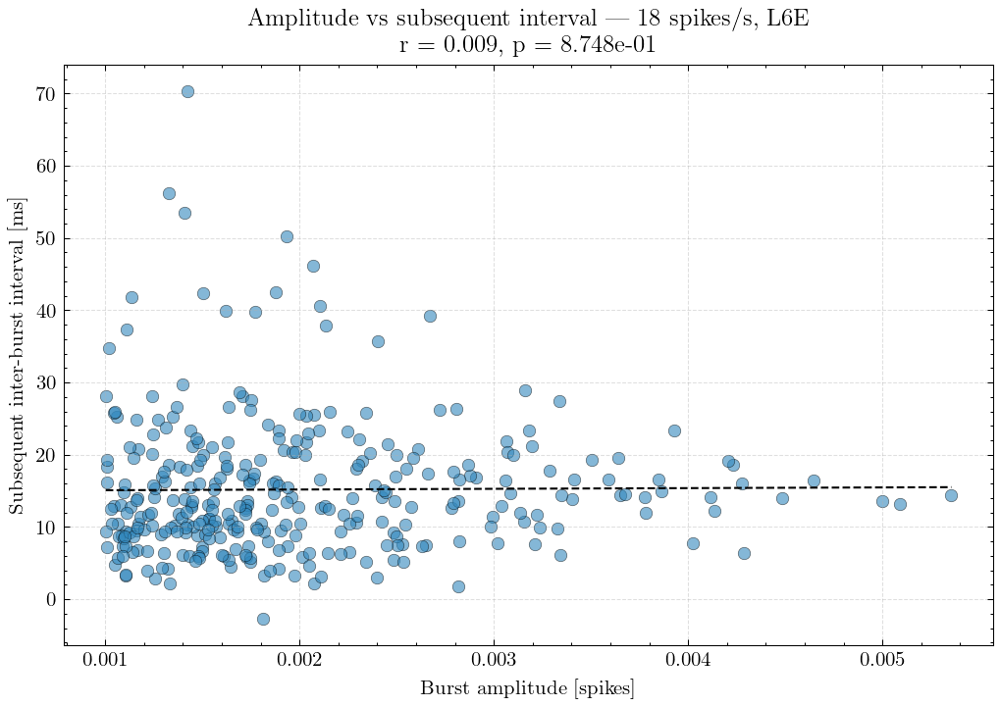

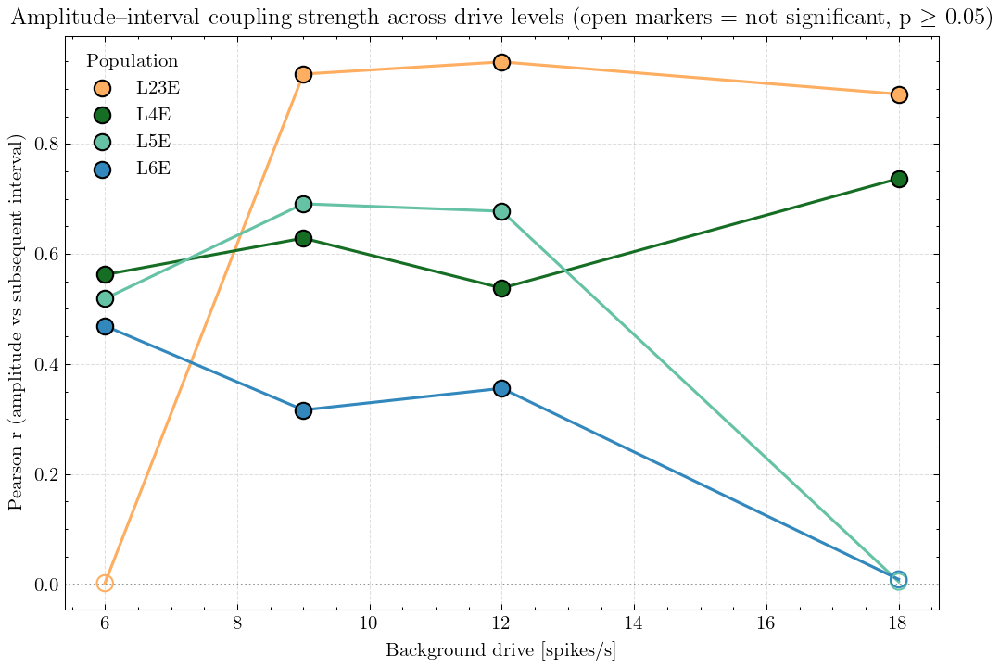

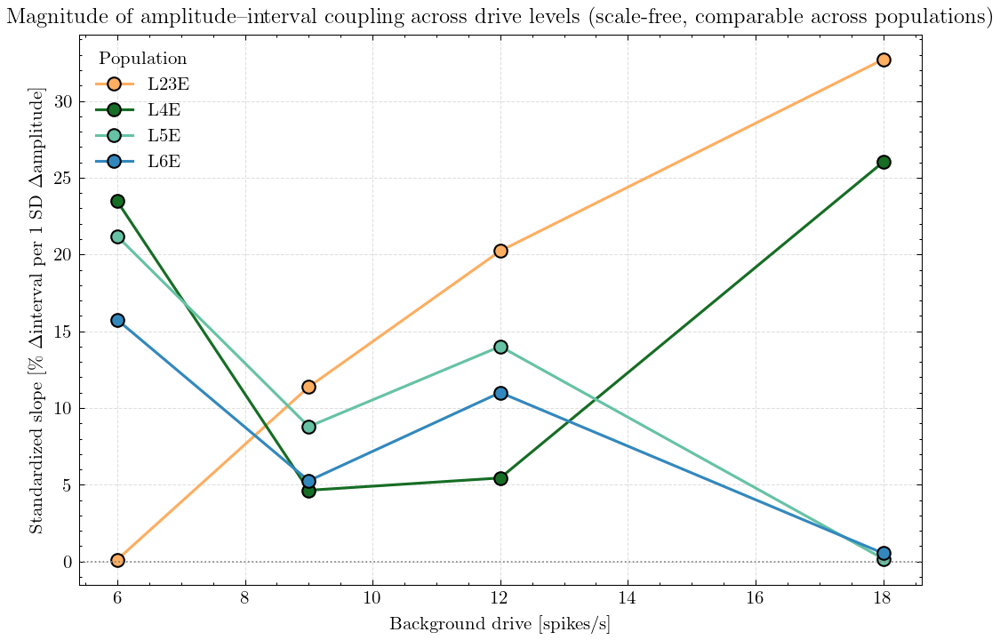

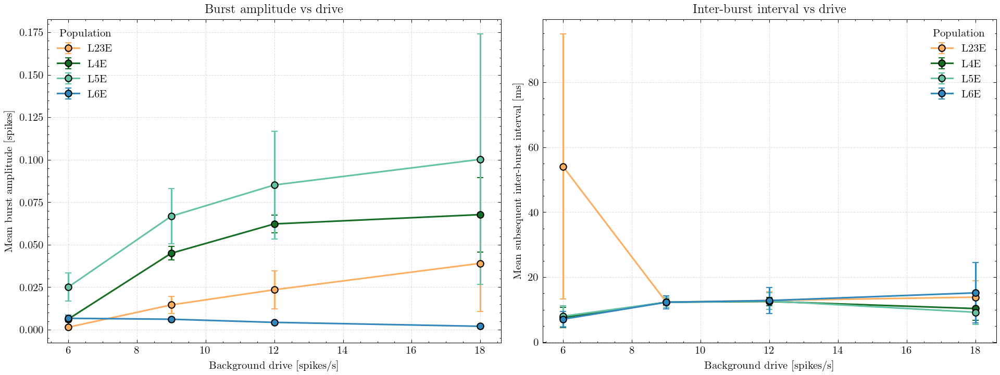

In [ ]:
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from scipy.signal import hilbert
from scipy.signal import find_peaks
from scipy.stats import pearsonr

bin_size = 15
peaks = {}
properties = {}
distances = {}
amplitudes = {}
bins = {}
bins_2 = {}

# NEW: raw (unpacked) storage for scatter/correlation
raw_amplitudes = {}   # amplitude of burst k
raw_distances  = {}   # interval *after* burst k  (i.e. distance to burst k+1)

distances_mean = np.zeros((len(pop_activity), len(pop_activity[0])))
amplitudes_mean = np.zeros((len(pop_activity), len(pop_activity[0])))
distances_std   = np.zeros((len(pop_activity), len(pop_activity[0])))
amplitudes_std  = np.zeros((len(pop_activity), len(pop_activity[0])))
bins_mean   = np.zeros((len(pop_activity), len(pop_activity[0]), bin_size+1))
bins_2_mean = np.zeros((len(pop_activity), len(pop_activity[0]), bin_size+1))
colors = ['#0072B2', '#D55E00', '#009E73', '#CC79A7'] 


inputs = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
layers = ["L23E", "L4E", "L5E", "L6E"]

stp  = 5
plot = True
r_matrix     = np.full((len(layers), len(inputs)), np.nan)
p_matrix     = np.full((len(layers), len(inputs)), np.nan)
slope_matrix = np.full((len(layers), len(inputs)), np.nan)
std_slope_matrix = np.full((len(layers), len(inputs)), np.nan)

for i in range(len(pop_activity)):
    peaks[i]      = {}
    properties[i] = {}
    distances[i]  = {}
    amplitudes[i] = {}
    bins[i]       = {}
    bins_2[i]     = {}
    raw_amplitudes[i] = {}
    raw_distances[i]  = {}

    for j in range(len(pop_activity[i])):
        peaks[i][j]      = {}
        properties[i][j] = {}
        distances[i][j]  = {}
        amplitudes[i][j] = {}
        bins[i][j]       = {}
        bins_2[i][j]     = {}

        test            = hilbert(pop_activity[i][j])
        test_amplitudes = np.abs(test)
        test_phases     = np.unwrap(np.angle(test))

        peaks[i][j], properties[i][j] = find_peaks(test_amplitudes, height=0.001, distance=20, width=3)

        # ── raw amplitude per burst ──────────────────────────────────────────
        amp_raw = test_amplitudes[peaks[i][j]]          # shape: (n_bursts,)
        # ── inter-burst intervals (distance from end of burst k to start of k+1)
        burst_distances = []
        for k in range(len(properties[i][j]['left_ips']) - 1):
            burst_distance = ((properties[i][j]['left_ips'][k+1] - properties[i][j]['right_ips'][k]) + properties[i][j]['widths'][k]) * 0.2
            burst_distances.append(burst_distance)
        # burst_distances has length  n_bursts - 1
        # pair amp of burst k  →  interval after burst k
        n_pairs = len(burst_distances)          # == n_bursts - 1
        raw_amplitudes[i][j] = amp_raw[:n_pairs]        # drop last burst (no interval after it)
        raw_distances[i][j]  = np.array(burst_distances)

        # ── Pearson correlation: amplitude vs subsequent interval ─────────────
        if n_pairs >= 2:
            r, p = pearsonr(raw_amplitudes[i][j], raw_distances[i][j])
        else:
            r, p = np.nan, np.nan



        # ── Scatter plot ─────────────────────────────────────────────────────
        fig, ax = plt.subplots(figsize=(7, 5), dpi=150)
        ax.scatter(
            raw_amplitudes[i][j],
            raw_distances[i][j],
            color=colors[j], alpha=0.6, edgecolors='k', linewidths=0.3
        )
        # overlay linear trend
        if n_pairs >= 2:
            m, b   = np.polyfit(raw_amplitudes[i][j], raw_distances[i][j], 1)
            x_line = np.linspace(raw_amplitudes[i][j].min(), raw_amplitudes[i][j].max(), 200)
            ax.plot(x_line, m * x_line + b, 'k--', linewidth=1)

        r_matrix[j][i] = r
        p_matrix[j][i] = p
        if n_pairs >= 2:
            slope_matrix[j][i] = m   # m already computed for the trend line
        if n_pairs >= 2:
            std_slope_matrix[j][i] = m * np.std(raw_amplitudes[i][j]) / np.mean(raw_distances[i][j]) * 100

        ax.set_xlabel("Burst amplitude [spikes]")
        ax.set_ylabel("Subsequent inter-burst interval [ms]")
        ax.set_title(
            f"Amplitude vs subsequent interval — {inputs[i]}, {layers[j]}\n"
            f"r = {r:.3f},  p = {p:.3e}"
        )
        ax.grid(True, linestyle='--', alpha=0.4)
        plt.tight_layout()
        plt.show()

        # ── statistics & histograms (unchanged from your original) ───────────
        amplitudes_mean[j][i] = np.mean(amp_raw)
        amplitudes_std[j][i]  = np.std(amp_raw)

        amplitudes[i][j], bins[i][j] = np.histogram(amp_raw, bins=bin_size, density=False)

        distances_mean[j][i] = np.mean(burst_distances)
        distances_std[j][i]  = np.std(burst_distances)

        distances[i][j], bins_2[i][j] = np.histogram(
            burst_distances, bins=bin_size, density=False
        )

drive_rates = [int(s.split()[0]) for s in inputs]  # [6, 9, 12, 18]

# ── Figure A: correlation strength vs drive ──────────────────────────────
import matplotlib as mpl
mpl.rcParams['font.family'] = 'sans-serif'

fig, ax = plt.subplots(figsize=(7, 5), dpi=150)
for j in range(len(layers)):
    ax.plot(drive_rates, r_matrix[j], '-', color=colors[j], linewidth=1.5, zorder=2)
    sig = p_matrix[j] < 0.05
    ax.scatter(np.array(drive_rates)[sig], r_matrix[j][sig],
               facecolors=colors[j], edgecolors='k', s=70, zorder=3, label=layers[j])
    ax.scatter(np.array(drive_rates)[~sig], r_matrix[j][~sig],
               facecolors='none', edgecolors=colors[j], s=70, zorder=3)

ax.axhline(0, color='gray', linewidth=0.8, linestyle=':')
ax.set_xlabel("Background drive [spikes/s]")
ax.set_ylabel("Pearson r (amplitude vs subsequent interval)")
ax.legend(title="Population")
ax.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# ── Figure B: standardized slope vs drive ─────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 5), dpi=150)
for j in range(len(layers)):
    ax.plot(drive_rates, std_slope_matrix[j], 'o-', color=colors[j],
             linewidth=1.5, markersize=7, markeredgecolor='k', label=layers[j])

ax.axhline(0, color='gray', linewidth=0.8, linestyle=':')
ax.set_xlabel("Background drive [spikes/s]")
ax.set_ylabel(r"Standardized slope [$\%$ $\Delta$interval per 1 SD $\Delta$amplitude]")
ax.set_title(r"Magnitude of amplitude–interval coupling across drive levels (scale-free, comparable across populations)")
ax.legend(title="Population")
ax.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# ── Figure C: mean burst amplitude & mean inter-burst interval vs drive ──
fig, axes = plt.subplots(1, 2, figsize=(13, 5), dpi=150)

for j in range(len(layers)):
    axes[0].errorbar(drive_rates, amplitudes_mean[j], yerr=amplitudes_std[j],
                      fmt='o-', color=colors[j], linewidth=1.5, markersize=6,
                      markeredgecolor='k', capsize=3, label=layers[j])
axes[0].set_xlabel("Background drive [spikes/s]")
axes[0].set_ylabel("Mean burst amplitude [spikes]")
axes[0].set_title("Burst amplitude vs drive")
axes[0].legend(title="Population")
axes[0].grid(True, linestyle='--', alpha=0.4)

for j in range(len(layers)):
    axes[1].errorbar(drive_rates, distances_mean[j], yerr=distances_std[j],
                      fmt='o-', color=colors[j], linewidth=1.5, markersize=6,
                      markeredgecolor='k', capsize=3, label=layers[j])
axes[1].set_xlabel("Background drive [spikes/s]")
axes[1].set_ylabel("Mean subsequent inter-burst interval [ms]")
axes[1].set_title("Inter-burst interval vs drive")
axes[1].legend(title="Population")
axes[1].grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

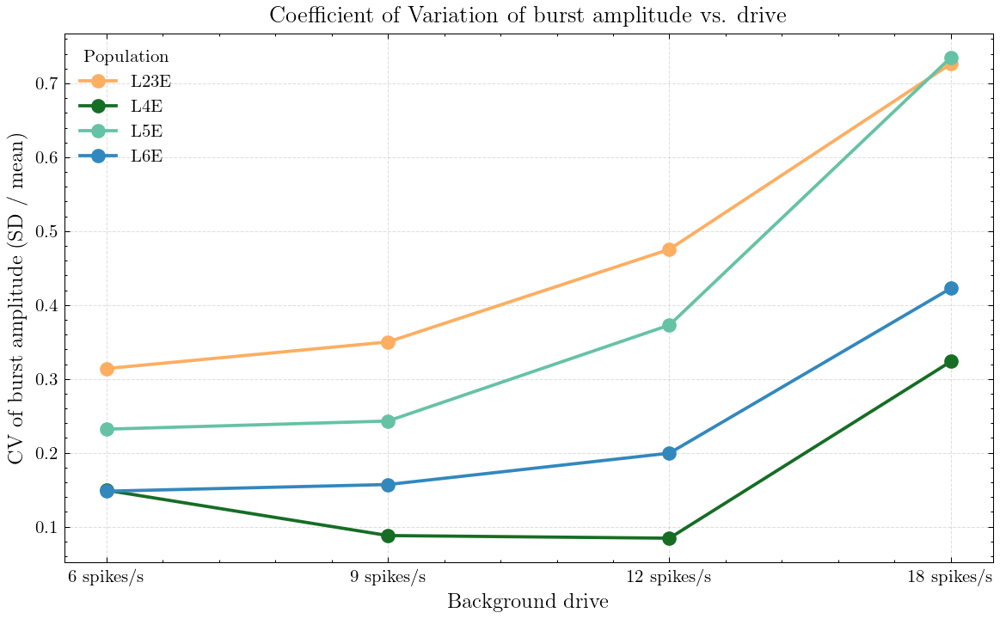

In [ ]:
from scipy.signal import hilbert, find_peaks
import numpy as np
import matplotlib.pyplot as plt

# ── Compute CV of peak amplitudes ────────────────────────────────────────────
# amplitudes_mean and amplitudes_std already computed in your loop
# shape: (n_layers, n_inputs) → e.g. (4, 4) for 4 layers × 4 drives

# CV = std / mean, shape same as amplitudes_mean
CV = np.divide(
    amplitudes_std,
    amplitudes_mean,
    out=np.full_like(amplitudes_mean, np.nan),   # NaN where mean == 0
    where=amplitudes_mean != 0
)
# CV shape: (n_populations, n_drives)  e.g. (4, 4)

# ── Plot ─────────────────────────────────────────────────────────────────────
drive_labels = inputs          # ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
x = np.arange(len(drive_labels))

markers   = ['o', 'o', 'o', 'o', 'o', 'o', 'o', 'o']
colors_cv = ['#fdae61', "#166d24", '#66c2a5', '#3288bd']

fig, ax = plt.subplots(figsize=(8, 5), dpi=150)

for pop_idx in range(CV.shape[0]):
    ax.plot(
        x, CV[pop_idx],
        marker=markers[pop_idx],
        color=colors_cv[pop_idx],
        linewidth=1.8,
        markersize=7,
        label=layers[pop_idx]
    )

ax.set_xticks(x)
ax.set_xticklabels(drive_labels)
ax.set_xlabel("Background drive", fontsize=12)
ax.set_ylabel("CV of burst amplitude", fontsize=12)
ax.set_title("Coefficient of Variation of burst amplitude vs. drive", fontsize=13)
ax.legend(title="Population", framealpha=0.8)
ax.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

In [9]:
dirs = os.listdir("data_background_rate_fig_1")
dirs = sorted(dirs)
#rates = np.linspace(5,20,len(dirs))
rates = np.zeros(len(dirs))

labels_rate = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
names = [6,9,12,18]
pop_activity = np.zeros((len(dirs),8,25000))

freq_sample = 0.0002

for i in range(len(dirs)):
    name = "data_background_rate_fig_1/" + dirs[i] + "/trial_0/"
    for j in range(8):
        name_2 = name + "measurements/pop_activities/pop_activity_" + str(j) + ".dat"
        pop_activity[i][j] = np.loadtxt(name_2)

In [10]:
dirs = os.listdir("data_background_rate_fig_1")
dirs = sorted(dirs)
#rates = np.linspace(5,20,len(dirs))
rates = np.zeros(len(dirs))

labels_rate = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
neurons = {}
times = {}

for i in range(len(dirs)):
    name = "data_background_rate_fig_1/" + dirs[i] + "/trial_0/"
    neurons[i] = []
    times[i] = []
    sd_names, node_ids, data = helpers.__load_spike_times(name,"spike_recorder",addons.analysis_dict["analysis_start"], addons.analysis_dict["analysis_end"])
    last_node_id = node_ids[-1, -1]
    mod_node_ids = np.abs(node_ids - last_node_id) + 1
    for j, n in enumerate(sd_names):
        times[i].append(data[j]["time_ms"])
        neurons[i].append(np.abs(data[j]["sender"] - last_node_id) + 1)

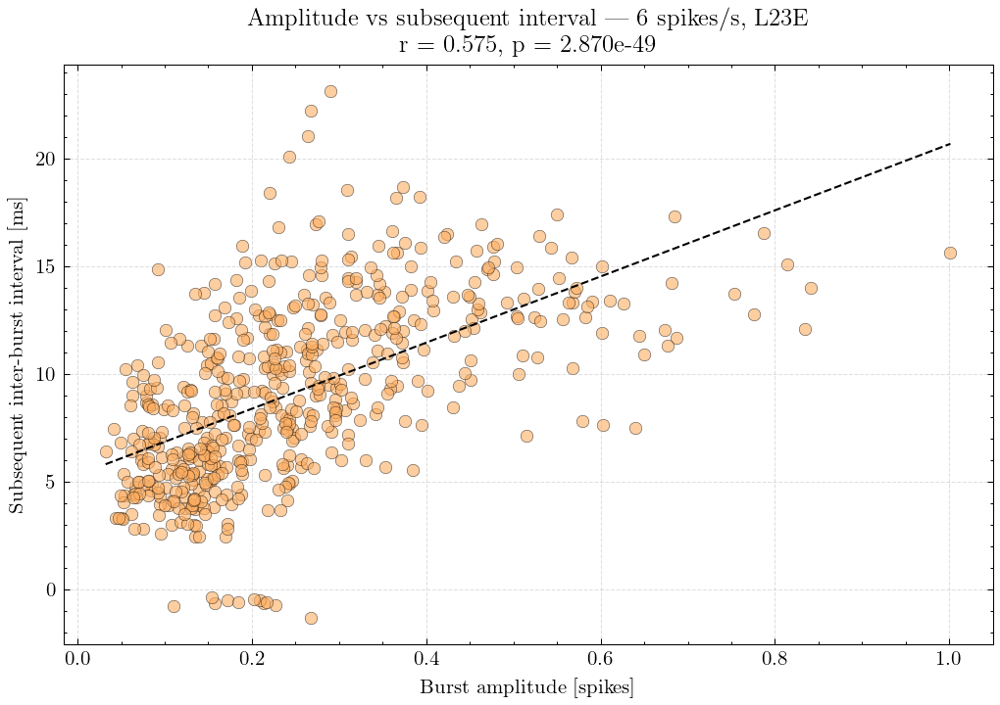

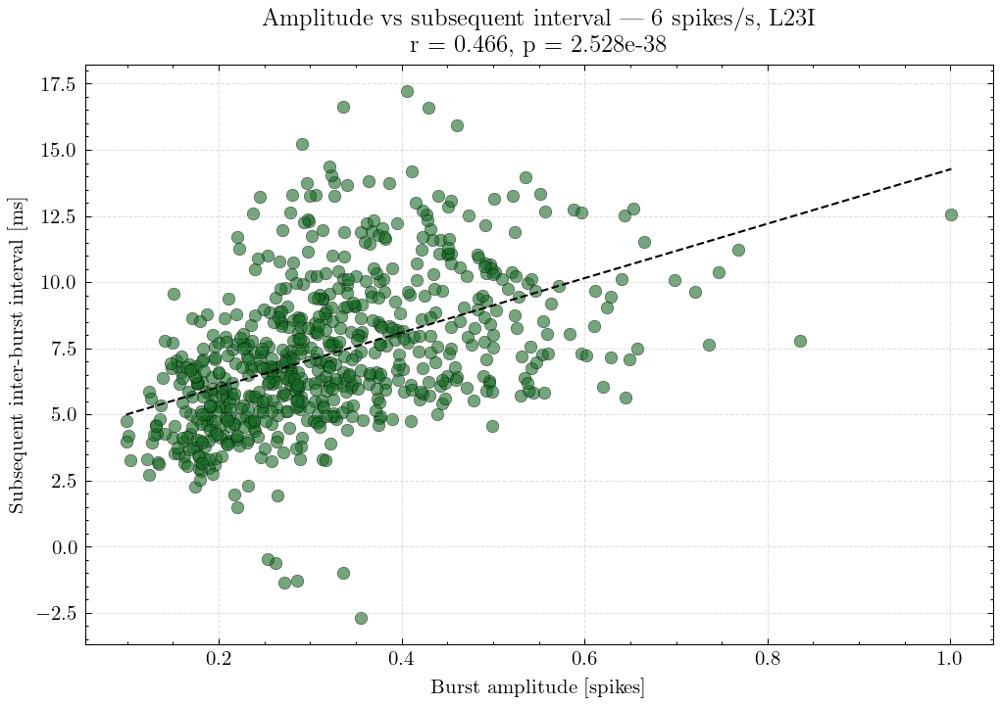

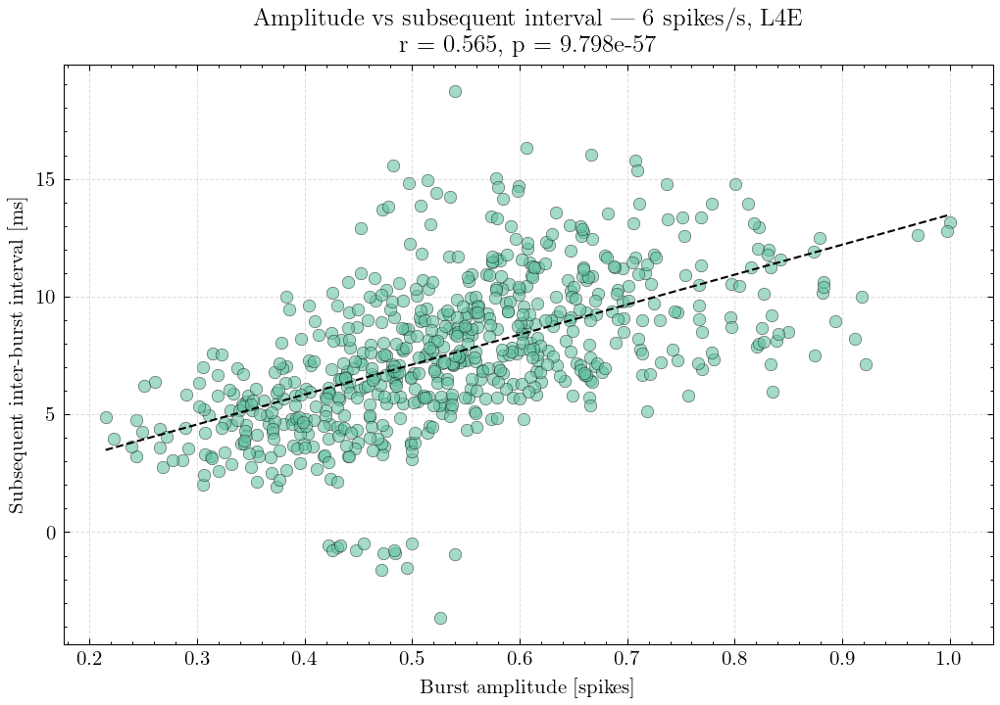

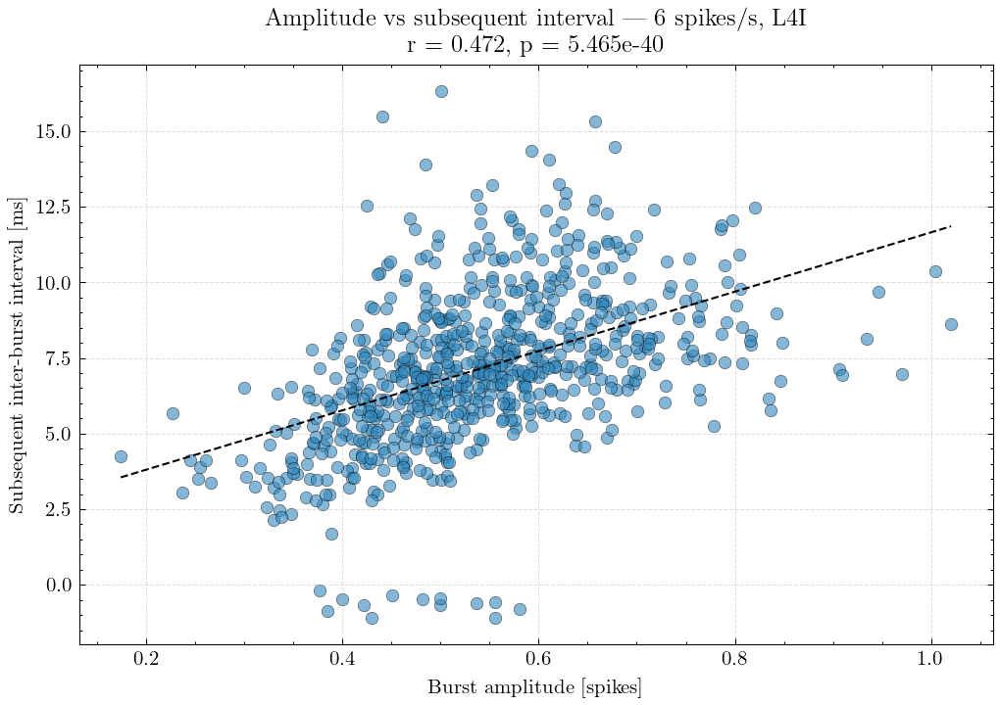

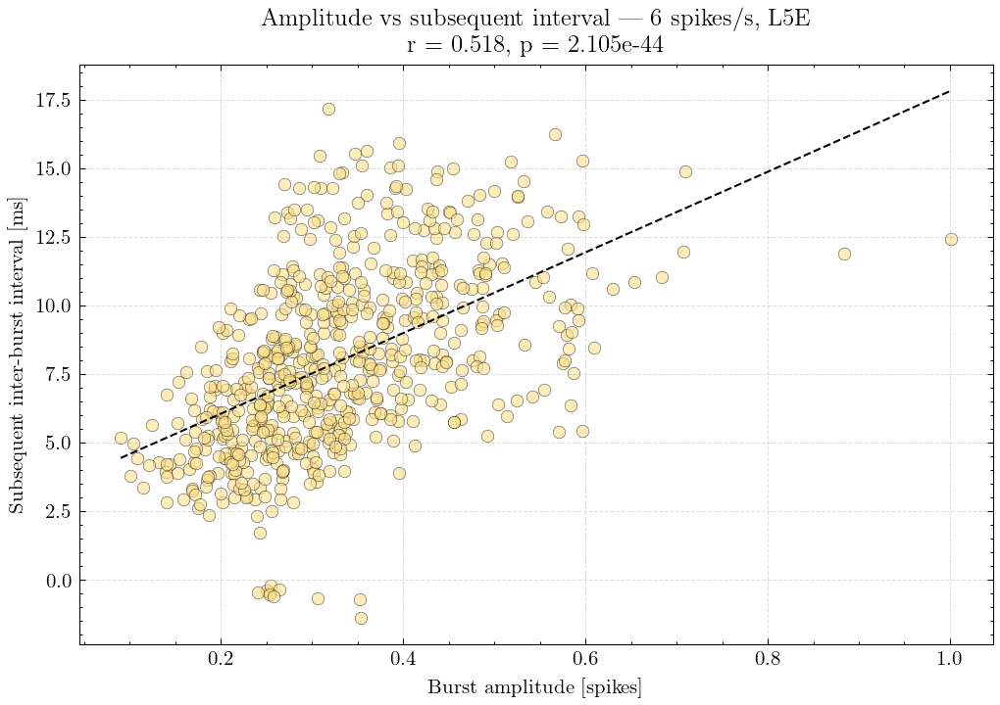

...

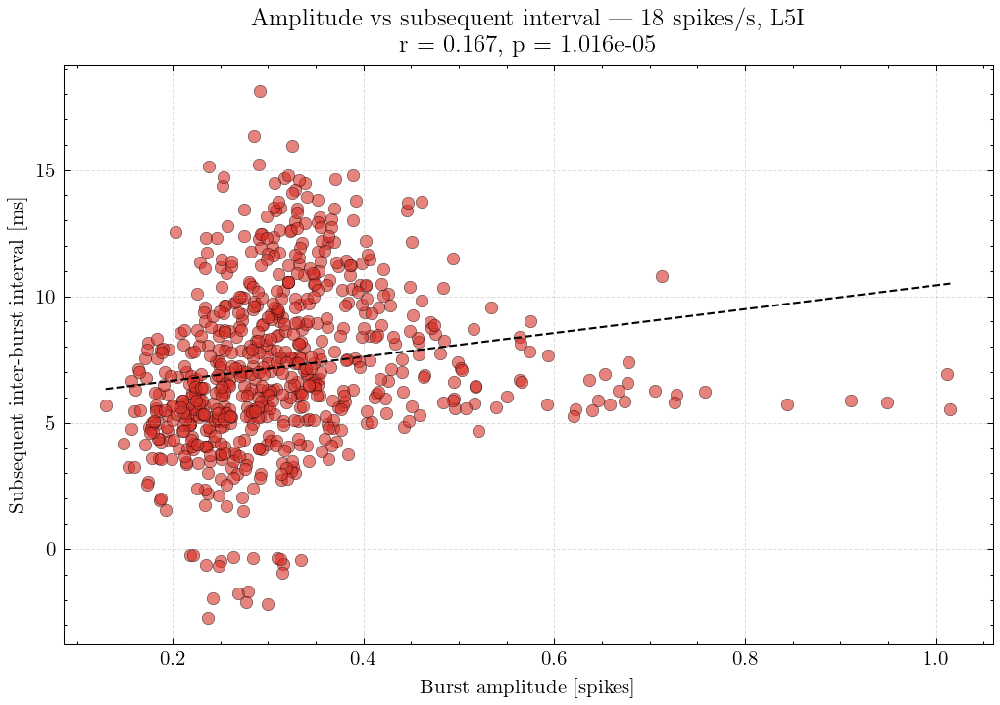

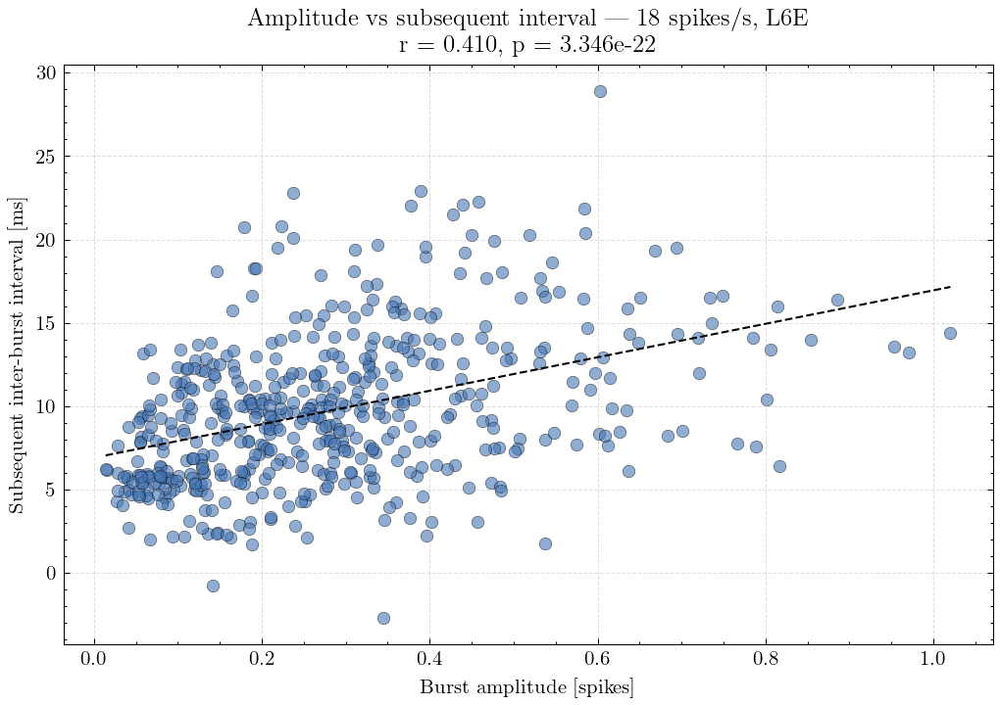

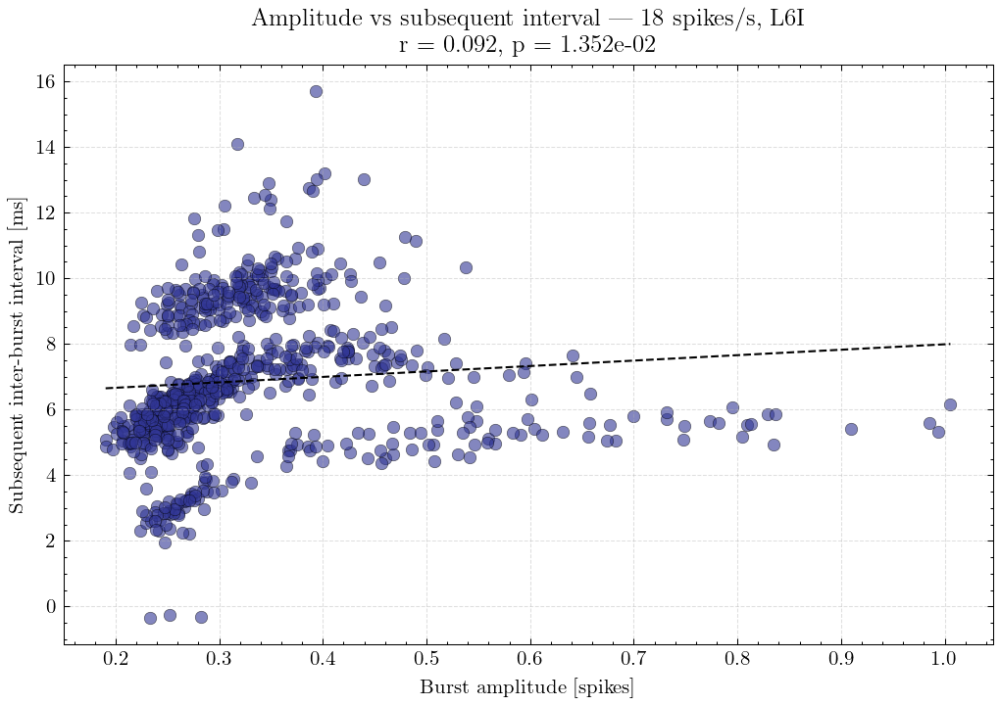

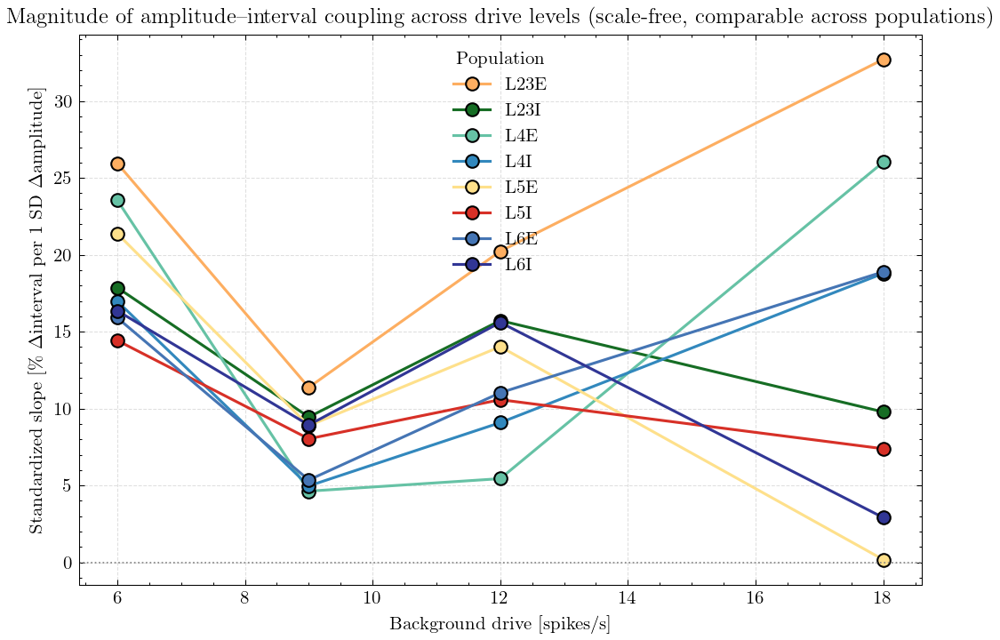

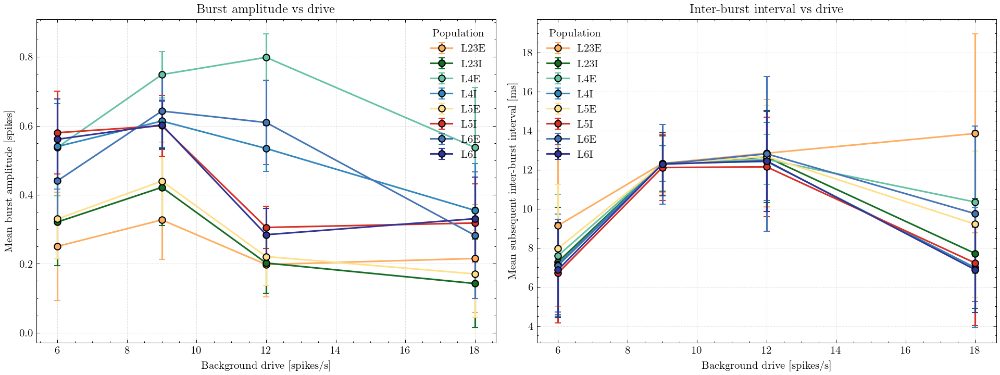

In [15]:
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from scipy.signal import hilbert
from scipy.signal import find_peaks
from scipy.stats import pearsonr

bin_size = 15
peaks = {}
properties = {}
distances = {}
amplitudes = {}
bins = {}
bins_2 = {}

# NEW: raw (unpacked) storage for scatter/correlation
raw_amplitudes = {}   # amplitude of burst k
raw_distances  = {}   # interval *after* burst k  (i.e. distance to burst k+1)

distances_mean = np.zeros((len(pop_activity[0]), len(pop_activity)))
amplitudes_mean = np.zeros((len(pop_activity[0]), len(pop_activity)))
distances_std   = np.zeros((len(pop_activity[0]), len(pop_activity)))
amplitudes_std  = np.zeros((len(pop_activity[0]), len(pop_activity)))
bins_mean   = np.zeros((len(pop_activity[0]), len(pop_activity), bin_size+1))
bins_2_mean = np.zeros((len(pop_activity[0]), len(pop_activity), bin_size+1))
colors = ['#fdae61', "#166d24", '#66c2a5', '#3288bd', '#fee08b', '#d73027', '#4575b4', '#313695']


inputs = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
layers = ["L23E", "L23I", "L4E", "L4I", "L5E", "L5I", "L6E", "L6I"]

stp  = 5
plot = True
r_matrix     = np.full((len(layers), len(inputs)), np.nan)
p_matrix     = np.full((len(layers), len(inputs)), np.nan)
slope_matrix = np.full((len(layers), len(inputs)), np.nan)
std_slope_matrix = np.full((len(layers), len(inputs)), np.nan)

for i in range(len(pop_activity)):
    peaks[i]      = {}
    properties[i] = {}
    distances[i]  = {}
    amplitudes[i] = {}
    bins[i]       = {}
    bins_2[i]     = {}
    raw_amplitudes[i] = {}
    raw_distances[i]  = {}

    for j in range(len(pop_activity[i])):
        peaks[i][j]      = {}
        properties[i][j] = {}
        distances[i][j]  = {}
        amplitudes[i][j] = {}
        bins[i][j]       = {}
        bins_2[i][j]     = {}

        test            = hilbert(pop_activity[i][j])
        test_amplitudes = np.abs(test)
        test_phases     = np.unwrap(np.angle(test))

        peaks[i][j], properties[i][j] = find_peaks(test_amplitudes, height=0.001, distance=20, width=3)

        # ── raw amplitude per burst ──────────────────────────────────────────
        amp_raw = test_amplitudes[peaks[i][j]]          # shape: (n_bursts,)
        # ── inter-burst intervals (distance from end of burst k to start of k+1)
        burst_distances = []
        for k in range(len(properties[i][j]['left_ips']) - 1):
            burst_distance = ((properties[i][j]['left_ips'][k+1] - properties[i][j]['right_ips'][k]) + properties[i][j]['widths'][k]) * 0.2
            burst_distances.append(burst_distance)
        # burst_distances has length  n_bursts - 1
        # pair amp of burst k  →  interval after burst k
        n_pairs = len(burst_distances)          # == n_bursts - 1
        raw_amplitudes[i][j] = amp_raw[:n_pairs]        # drop last burst (no interval after it)
        raw_distances[i][j]  = np.array(burst_distances)

        # ── Pearson correlation: amplitude vs subsequent interval ─────────────
        if n_pairs >= 2:
            r, p = pearsonr(raw_amplitudes[i][j], raw_distances[i][j])
        else:
            r, p = np.nan, np.nan



        # ── Scatter plot ─────────────────────────────────────────────────────
        fig, ax = plt.subplots(figsize=(7, 5), dpi=150)
        ax.scatter(
            raw_amplitudes[i][j],
            raw_distances[i][j],
            color=colors[j], alpha=0.6, edgecolors='k', linewidths=0.3
        )
        # overlay linear trend
        if n_pairs >= 2:
            m, b   = np.polyfit(raw_amplitudes[i][j], raw_distances[i][j], 1)
            x_line = np.linspace(raw_amplitudes[i][j].min(), raw_amplitudes[i][j].max(), 200)
            ax.plot(x_line, m * x_line + b, 'k--', linewidth=1)

        r_matrix[j][i] = r
        p_matrix[j][i] = p
        if n_pairs >= 2:
            slope_matrix[j][i] = m   # m already computed for the trend line
        if n_pairs >= 2:
            std_slope_matrix[j][i] = m * np.std(raw_amplitudes[i][j]) / np.mean(raw_distances[i][j]) * 100

        ax.set_xlabel("Burst amplitude [spikes]")
        ax.set_ylabel("Subsequent inter-burst interval [ms]")
        ax.set_title(
            f"Amplitude vs subsequent interval — {inputs[i]}, {layers[j]}\n"
            f"r = {r:.3f},  p = {p:.3e}"
        )
        ax.grid(True, linestyle='--', alpha=0.4)
        plt.tight_layout()
        plt.show()

        # ── statistics & histograms (unchanged from your original) ───────────
        amplitudes_mean[j][i] = np.mean(amp_raw)
        amplitudes_std[j][i]  = np.std(amp_raw)

        amplitudes[i][j], bins[i][j] = np.histogram(amp_raw, bins=bin_size, density=False)

        distances_mean[j][i] = np.mean(burst_distances)
        distances_std[j][i]  = np.std(burst_distances)

        distances[i][j], bins_2[i][j] = np.histogram(
            burst_distances, bins=bin_size, density=False
        )

drive_rates = [int(s.split()[0]) for s in inputs]  # [6, 9, 12, 18]

# ── Figure B: standardized slope vs drive ─────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 5), dpi=150)
for j in range(len(layers)):
    ax.plot(drive_rates, std_slope_matrix[j], 'o-', color=colors[j],
             linewidth=1.5, markersize=7, markeredgecolor='k', label=layers[j])

ax.axhline(0, color='gray', linewidth=0.8, linestyle=':')
ax.set_xlabel("Background drive [spikes/s]")
ax.set_ylabel(r"Standardized slope [$\%$ $\Delta$interval per 1 SD $\Delta$amplitude]")
ax.set_title(r"Magnitude of amplitude–interval coupling across drive levels (scale-free, comparable across populations)")
ax.legend(title="Population")
ax.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# ── Figure C: mean burst amplitude & mean inter-burst interval vs drive ──
fig, axes = plt.subplots(1, 2, figsize=(13, 5), dpi=150)

for j in range(len(layers)):
    axes[0].errorbar(drive_rates, amplitudes_mean[j], yerr=amplitudes_std[j],
                      fmt='o-', color=colors[j], linewidth=1.5, markersize=6,
                      markeredgecolor='k', capsize=3, label=layers[j])
axes[0].set_xlabel("Background drive [spikes/s]")
axes[0].set_ylabel("Mean burst amplitude [spikes]")
axes[0].set_title("Burst amplitude vs drive")
axes[0].legend(title="Population")
axes[0].grid(True, linestyle='--', alpha=0.4)

for j in range(len(layers)):
    axes[1].errorbar(drive_rates, distances_mean[j], yerr=distances_std[j],
                      fmt='o-', color=colors[j], linewidth=1.5, markersize=6,
                      markeredgecolor='k', capsize=3, label=layers[j])
axes[1].set_xlabel("Background drive [spikes/s]")
axes[1].set_ylabel("Mean subsequent inter-burst interval [ms]")
axes[1].set_title("Inter-burst interval vs drive")
axes[1].legend(title="Population")
axes[1].grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

In [17]:
# ── Build SPIKING_TARGETS dict for meanfield_microcircuit.py fit ────────────
# Requires: `times` (cell 9, per-population spike times per drive level),
#           `amplitudes_mean`, `distances_mean` (cell 16, burst statistics)

num_neurons_full = np.array([20683, 5834, 21915, 5479, 4850, 1065, 14395, 2948])
full_pop_names   = ["L23E", "L23I", "L4E", "L4I", "L5E", "L5I", "L6E", "L6I"]

# `layers`/`pop_activity` above only cover the 4 excitatory populations
# (pop_activity_0, pop_activity_2, ... -> indices 0,2,4,6 in the full 8-pop list)
exc_pop_indices = [0, 1, 2, 3, 4, 5, 6, 7]
exc_pop_names   = ["L23E", "L23I", "L4E", "L4I", "L5E", "L5I", "L6E", "L6I"]  # matches `layers` order above

analysis_duration_s = (addons.analysis_dict["analysis_end"] - addons.analysis_dict["analysis_start"]) / 1000.0
drive_rates = [6, 9, 12, 18]

print("SPIKING_TARGETS = {")
for i, rate in enumerate(drive_rates):
    print(f"    {rate}: {{")
    for j, pop_name in enumerate(exc_pop_names):
        full_idx = exc_pop_indices[j]

        # mean firing rate: total spikes in the analysis window / (duration * N neurons)
        # NOTE: this assumes `times[i][k]` follows the same population order as
        # `full_pop_names` (i.e. the order NEST's spike recorders were created in,
        # which should match net_dict["populations"]). Print sd_names once to
        # confirm this ordering if the numbers look off.
        n_spikes  = len(times[i][full_idx])
        rate_mean = n_spikes / (analysis_duration_s * num_neurons_full[full_idx])

        amp_mean = amplitudes_mean[j][i]
        ibi_mean = distances_mean[j][i]

        print(f'        "{pop_name}": {{"rate_mean": {rate_mean:.4f}, '
              f'"amp_mean": {amp_mean:.6f}, "ibi_mean": {ibi_mean:.4f}}},')
    print("    },")
print("}")


SPIKING_TARGETS = {
    6: {
        "L23E": {"rate_mean": 0.1385, "amp_mean": 0.250392, "ibi_mean": 9.1415},
        "L23I": {"rate_mean": 1.2147, "amp_mean": 0.320998, "ibi_mean": 7.2794},
        "L4E": {"rate_mean": 1.8622, "amp_mean": 0.537561, "ibi_mean": 7.5916},
        "L4I": {"rate_mean": 3.2742, "amp_mean": 0.540082, "ibi_mean": 7.1462},
        "L5E": {"rate_mean": 7.0680, "amp_mean": 0.329851, "ibi_mean": 7.9690},
        "L5I": {"rate_mean": 4.6368, "amp_mean": 0.580102, "ibi_mean": 6.7055},
        "L6E": {"rate_mean": 1.9246, "amp_mean": 0.440544, "ibi_mean": 7.0903},
        "L6I": {"rate_mean": 4.8142, "amp_mean": 0.561052, "ibi_mean": 6.8694},
    },
    9: {
        "L23E": {"rate_mean": 1.3903, "amp_mean": 0.327158, "ibi_mean": 12.3274},
        "L23I": {"rate_mean": 4.0951, "amp_mean": 0.421547, "ibi_mean": 12.3238},
        "L4E": {"rate_mean": 5.6967, "amp_mean": 0.748664, "ibi_mean": 12.3217},
        "L4I": {"rate_mean": 7.3723, "amp_mean": 0.613847, "ibi_mean

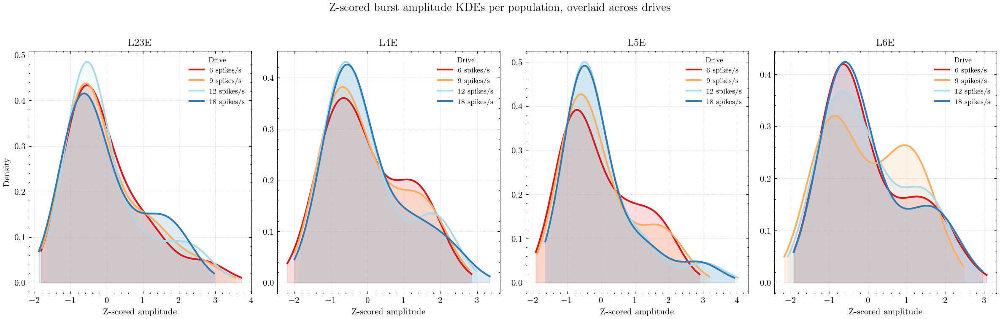

In [25]:
from scipy.stats import zscore
from scipy.stats import gaussian_kde

fig, axes = plt.subplots(1, len(layers), figsize=(16, 5), dpi=150, sharey=False)

drive_colors = ['#d7191c', '#fdae61', '#abd9e9', '#2c7bb6']  # one per drive

for pop_idx, (ax, layer_name) in enumerate(zip(axes, layers)):
    for drive_idx in range(len(inputs)):
        # ── raw per-burst amplitudes for this population × drive ─────────────
        amp_raw = amplitudes[drive_idx][pop_idx]
        
        if len(amp_raw) < 2:
            continue

        # ── Z-score within this drive ────────────────────────────────────────
        amp_z = zscore(amp_raw)

        # ── KDE ──────────────────────────────────────────────────────────────
        kde       = gaussian_kde(amp_z, bw_method='scott')
        x_grid    = np.linspace(amp_z.min() - 1, amp_z.max() + 1, 400)
        kde_vals  = kde(x_grid)

        ax.plot(x_grid, kde_vals,
                color=drive_colors[drive_idx],
                linewidth=2,
                label=inputs[drive_idx])
        ax.fill_between(x_grid, kde_vals,
                        color=drive_colors[drive_idx],
                        alpha=0.15)

    ax.set_title(layer_name, fontsize=12)
    ax.set_xlabel("Z-scored amplitude", fontsize=10)
    if pop_idx == 0:
        ax.set_ylabel("Density", fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.legend(title="Drive", fontsize=8, title_fontsize=8)

fig.suptitle("Z-scored burst amplitude KDEs per population, overlaid across drives",
             fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

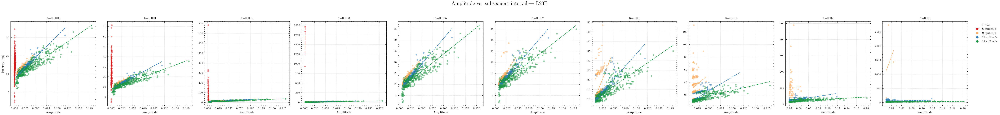

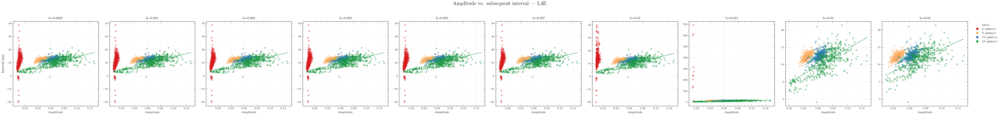

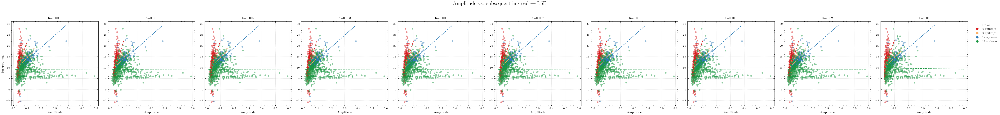

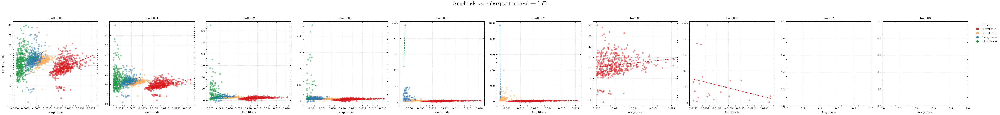

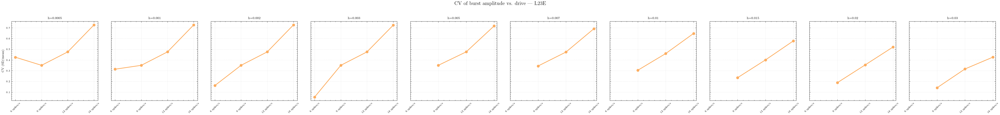

...

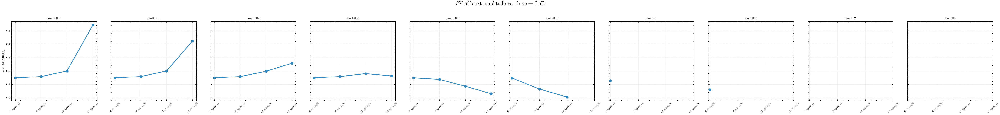

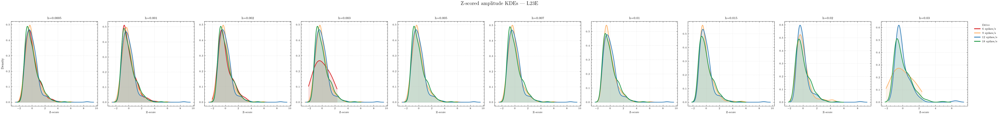

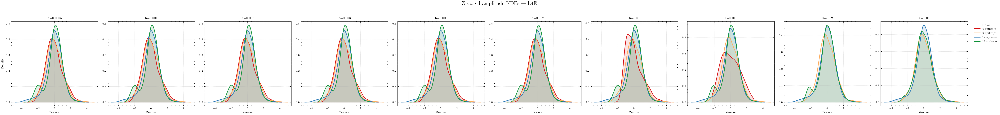

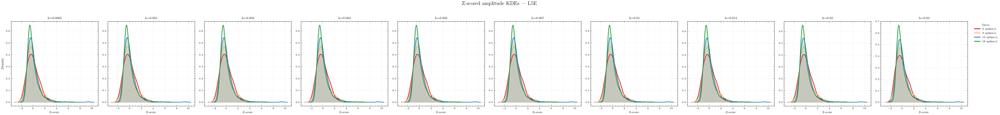

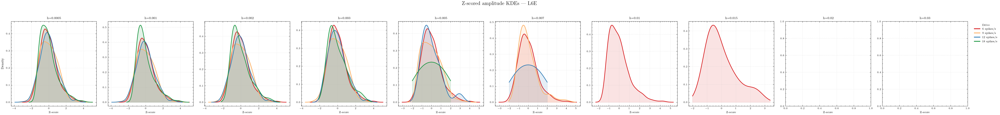

In [7]:
from scipy.signal import hilbert, find_peaks
from scipy.stats import pearsonr, zscore, gaussian_kde
import numpy as np
import matplotlib.pyplot as plt

heights   = [0.0005, 0.001, 0.002, 0.003, 0.005, 0.007, 0.01, 0.015, 0.02, 0.03]
inputs    = ["6 spikes/s", "9 spikes/s", "12 spikes/s", "18 spikes/s"]
layers    = ["L23E", "L4E", "L5E", "L6E"]
colors    = ['#fdae61', "#166d24", '#66c2a5', '#3288bd']
bin_size  = 15

# ── Storage across height values ──────────────────────────────────────────────
# raw_amps[h_idx][drive][pop]  → amp array
# raw_dists[h_idx][drive][pop] → distance array
# amp_mean/std[h_idx] shape    → (n_pops, n_drives)  for CV
raw_amps  = {}
raw_dists = {}
amp_mean  = {}
amp_std   = {}

n_drives  = len(inputs)
n_heights = len(heights)
n_pops    = len(layers)

for h_idx, height_val in enumerate(heights):

    raw_amps[h_idx]  = {i: {} for i in range(n_drives)}
    raw_dists[h_idx] = {i: {} for i in range(n_drives)}
    amp_mean[h_idx]  = np.zeros((n_pops, n_drives))
    amp_std[h_idx]   = np.zeros((n_pops, n_drives))

    for i in range(n_drives):
        for j in range(n_pops):

            test            = hilbert(pop_activity[i][j])
            test_amplitudes = np.abs(test)

            peaks_ij, props_ij = find_peaks(
                test_amplitudes,
                height=height_val,
                distance=20,
                width=3
            )

            amp_raw = test_amplitudes[peaks_ij]

            burst_distances = []
            for k in range(len(props_ij['left_ips']) - 1):
                bd = ((props_ij['left_ips'][k+1] - props_ij['right_ips'][k])
                      + props_ij['widths'][k]) * 0.2
                burst_distances.append(bd)

            n_pairs = len(burst_distances)
            raw_amps[h_idx][i][j]  = amp_raw[:n_pairs]
            raw_dists[h_idx][i][j] = np.array(burst_distances)

            amp_mean[h_idx][j, i]  = np.mean(amp_raw) if len(amp_raw) > 0 else np.nan
            amp_std[h_idx][j, i]   = np.std(amp_raw)  if len(amp_raw) > 0 else np.nan


# ── Figure 1 (per population): scatter amplitude vs interval, 10 columns ──────
drive_colors = ['#d7191c', '#fdae61', '#2c7bb6', '#1a9641']

for pop_idx, layer_name in enumerate(layers):

    fig, axes = plt.subplots(
        1, n_heights,
        figsize=(3.5 * n_heights, 4),
        dpi=150,
        sharey=False
    )
    fig.suptitle(
        f"Amplitude vs. subsequent interval — {layer_name}",
        fontsize=13, y=1.02
    )

    for h_idx, (ax, height_val) in enumerate(zip(axes, heights)):

        for drive_idx in range(n_drives):
            a = raw_amps[h_idx][drive_idx][pop_idx]
            d = raw_dists[h_idx][drive_idx][pop_idx]

            if len(a) < 2:
                continue

            r, p = pearsonr(a, d)

            ax.scatter(a, d,
                       color=drive_colors[drive_idx],
                       alpha=0.5, s=15, edgecolors='none',
                       label=inputs[drive_idx] if h_idx == 0 else None)

            # linear trend per drive
            m, b   = np.polyfit(a, d, 1)
            x_line = np.linspace(a.min(), a.max(), 200)
            ax.plot(x_line, m * x_line + b,
                    color=drive_colors[drive_idx],
                    linewidth=1.2, linestyle='--')

        ax.set_title(f"h={height_val}", fontsize=8)
        ax.set_xlabel("Amplitude", fontsize=7)
        if h_idx == 0:
            ax.set_ylabel("Interval [ms]", fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.3)
        ax.tick_params(labelsize=6)

    handles = [
        plt.Line2D([0], [0], marker='o', color='w',
                   markerfacecolor=drive_colors[d],
                   markersize=7, label=inputs[d])
        for d in range(n_drives)
    ]
    axes[-1].legend(handles=handles, title="Drive",
                    fontsize=7, title_fontsize=7,
                    bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.savefig(f"scatter_{layer_name}.svg", bbox_inches='tight', dpi=300)
    plt.show()


# ── Figure 2 (per population): CV vs drive, 10 columns ───────────────────────
for pop_idx, layer_name in enumerate(layers):

    fig, axes = plt.subplots(
        1, n_heights,
        figsize=(3.5 * n_heights, 4),
        dpi=150,
        sharey=True
    )
    fig.suptitle(
        f"CV of burst amplitude vs. drive — {layer_name}",
        fontsize=13, y=1.02
    )

    x = np.arange(n_drives)

    for h_idx, (ax, height_val) in enumerate(zip(axes, heights)):

        cv = np.divide(
            amp_std[h_idx][pop_idx],
            amp_mean[h_idx][pop_idx],
            out=np.full(n_drives, np.nan),
            where=amp_mean[h_idx][pop_idx] != 0
        )

        ax.plot(x, cv, marker='o', color=colors[pop_idx],
                linewidth=1.8, markersize=6)
        ax.set_xticks(x)
        ax.set_xticklabels(inputs, rotation=45, fontsize=6)
        ax.set_title(f"h={height_val}", fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.3)
        ax.tick_params(labelsize=6)

        if h_idx == 0:
            ax.set_ylabel("CV (SD/mean)", fontsize=8)

    plt.tight_layout()
    plt.savefig(f"CV_{layer_name}.svg", bbox_inches='tight', dpi=300)
    plt.show()


# ── Figure 3 (per population): Z-scored KDEs overlaid across drives, 10 cols ──
for pop_idx, layer_name in enumerate(layers):

    fig, axes = plt.subplots(
        1, n_heights,
        figsize=(3.5 * n_heights, 4),
        dpi=150,
        sharey=False
    )
    fig.suptitle(
        f"Z-scored amplitude KDEs — {layer_name}",
        fontsize=13, y=1.02
    )

    for h_idx, (ax, height_val) in enumerate(zip(axes, heights)):

        for drive_idx in range(n_drives):
            a = raw_amps[h_idx][drive_idx][pop_idx]

            # raw_amps are already trimmed to n_pairs; recover full amp_raw
            # by re-using the stored mean/std to z-score what we have
            if len(a) < 2:
                continue

            amp_z = zscore(a)
            kde   = gaussian_kde(amp_z, bw_method='scott')
            xg    = np.linspace(amp_z.min() - 1, amp_z.max() + 1, 400)
            ax.plot(xg, kde(xg),
                    color=drive_colors[drive_idx],
                    linewidth=1.5,
                    label=inputs[drive_idx] if h_idx == 0 else None)
            ax.fill_between(xg, kde(xg),
                            color=drive_colors[drive_idx], alpha=0.12)

        ax.set_title(f"h={height_val}", fontsize=8)
        ax.set_xlabel("Z-score", fontsize=7)
        if h_idx == 0:
            ax.set_ylabel("Density", fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.3)
        ax.tick_params(labelsize=6)

    handles = [
        plt.Line2D([0], [0], color=drive_colors[d], linewidth=2,
                   label=inputs[d])
        for d in range(n_drives)
    ]
    axes[-1].legend(handles=handles, title="Drive",
                    fontsize=7, title_fontsize=7,
                    bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.savefig(f"KDE_{layer_name}.svg", bbox_inches='tight', dpi=300)
    plt.show()